#  Install moviepy Package Offline

In [3]:
!conda install /kaggle/input/moviepy/*.tar.bz2


######################################################################## | 100% 
######################################################################## | 100% 
######################################################################## | 100% 
######################################################################## | 100% 
######################################################################## | 100% 
######################################################################## | 100% 
######################################################################## | 100% 
######################################################################## | 100% 
######################################################################## | 100% 
######################################################################## | 100% 
######################################################################## | 100% 
######################################################################## | 100% 
###########################

# Load Training Data
## load event label

In [4]:
import moviepy
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn
from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip
from IPython.display import Video

In [5]:
root_dir = '../input/dfl-bundesliga-data-shootout'
data_path = os.path.join(root_dir, 'train.csv')
df = pd.read_csv(data_path)
df

,video_id,time,event,event_attributes
0,1606b0e6_0,200.265822,start,NaN
1,1606b0e6_0,201.150000,challenge,['ball_action_forced']
2,1606b0e6_0,202.765822,end,NaN
3,1606b0e6_0,210.124111,start,NaN
4,1606b0e6_0,210.870000,challenge,['opponent_dispossessed']
...,...,...,...,...
11213,ecf251d4_0,3056.587000,challenge,['opponent_dispossessed']
11214,ecf251d4_0,3058.072895,end,NaN
11215,ecf251d4_0,3068.280519,start,NaN
11216,ecf251d4_0,3069.547000,throwin,['pass']


In [6]:
df_throwin = df[df["event"] == "throwin"].reset_index()
df_throwin

,index,video_id,time,event,event_attributes
0,7,1606b0e6_0,219.230,throwin,['pass']
1,101,1606b0e6_0,427.670,throwin,['pass']
2,119,1606b0e6_0,474.390,throwin,['cross']
3,162,1606b0e6_0,621.110,throwin,['cross']
4,265,1606b0e6_0,875.390,throwin,['pass']
...,...,...,...,...,...
167,10963,ecf251d4_0,2216.147,throwin,['pass']
168,10984,ecf251d4_0,2249.467,throwin,['pass']
169,10996,ecf251d4_0,2311.747,throwin,['pass']
170,11130,ecf251d4_0,2874.827,throwin,['pass']


##  visualize event

In [7]:
# Visualize an event from train.csv
# clip is saved as 'test_{index}.mp4'
def vis_event(row, before=5, after=5):
    print(row["event_attributes"])
    filename = f"test_{row['index']}.mp4"
    ffmpeg_extract_subclip(
        f"../input/dfl-bundesliga-data-shootout/train/{row['video_id']}.mp4", 
        int(row['time']) - before, 
        int(row['time']) + after, 
        targetname=filename,
    )
    
    return Video(filename, width=800)

In [8]:
vis_event(df_throwin.iloc[0])

['pass']
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


In [61]:
vis_event(df_throwin.iloc[1])

['pass']
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


In [35]:
import cv2
from PIL import Image

##  test basic features of video

In [12]:
vidcap = cv2.VideoCapture("test_7.mp4")

fps = vidcap.get(cv2.CAP_PROP_FPS)
print(f"fps: {fps}")
frame_count = vidcap.get(cv2.CAP_PROP_FRAME_COUNT)
print(f"frame_count: {frame_count}")

count = 0
success, image = vidcap.read()
while success:
    count += 1
    success, image = vidcap.read()

print(f"{count} frames.")

fps: 25.0
frame_count: 352.0
252 frames.


In [62]:
vidcap = cv2.VideoCapture("test_101.mp4")

fps = vidcap.get(cv2.CAP_PROP_FPS)
print(f"fps: {fps}")
frame_count = vidcap.get(cv2.CAP_PROP_FRAME_COUNT)
print(f"frame_count: {frame_count}")

count = 0
success, image = vidcap.read()
while success:
    count += 1
    success, image = vidcap.read()

print(f"{count} frames.")

fps: 25.0
frame_count: 302.0
252 frames.


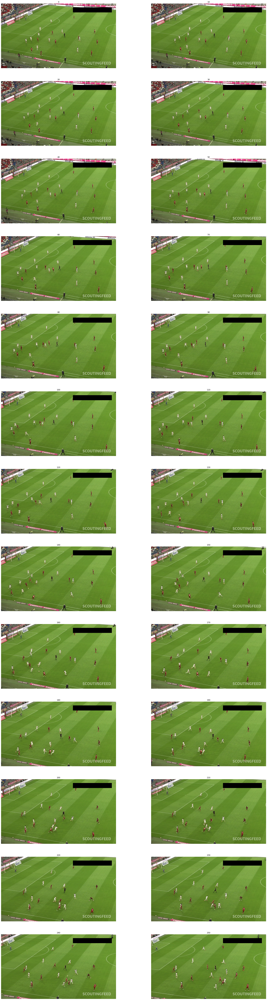

In [54]:
plt.figure(figsize=(32,128))

vidcap = cv2.VideoCapture("test_7.mp4")
np_video = []

success, image = vidcap.read()
count = 0
while success:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    if not count % 10:
        np_video.append(image)
        plt.subplot(14, 2, count // 10 + 1)
        plt.imshow(image)
        plt.title(str(count))
        plt.axis("off")
    success, image = vidcap.read()
        
    count += 1

26


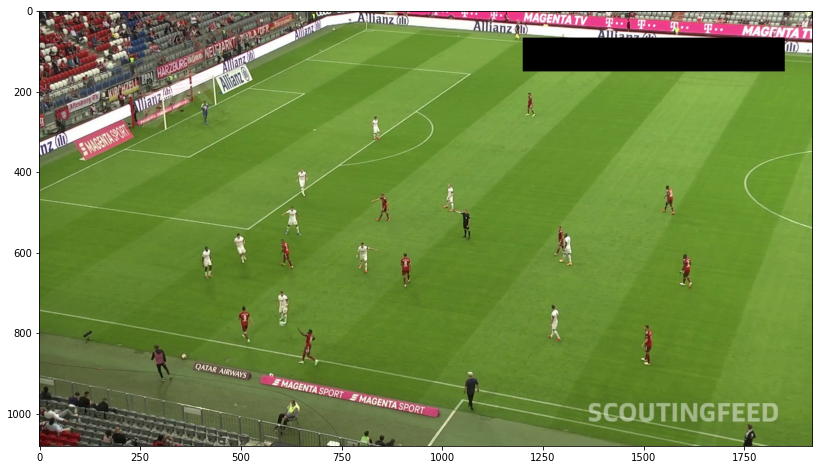

In [58]:
print(len(np_video))
test_image = np_video[0]

plt.figure(figsize=(16, 8))
plt.imshow(test_image)

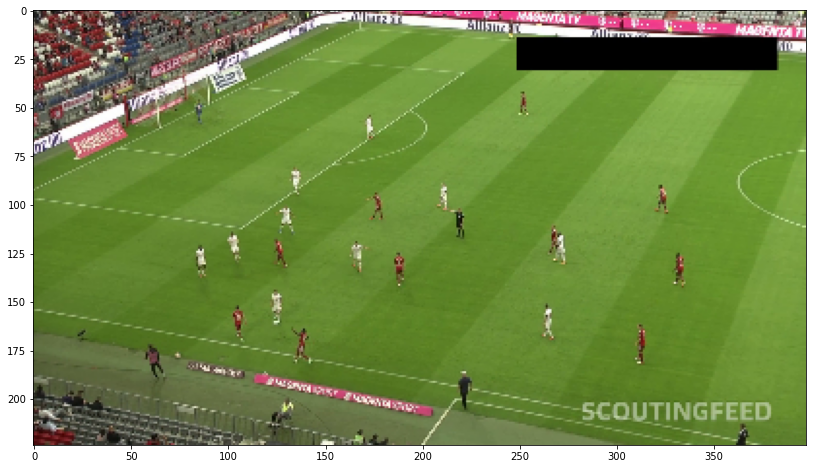

In [60]:
test_image = cv2.resize(test_image,[398,224])
plt.figure(figsize=(16, 8))
plt.imshow(test_image)

## testing conclusion 
**From these testing, we can find that:**
* video resolution is (1080, 1920, 3)
* FPS is 25, indicating 252 frames in a 10-sec video

**To reduce the computational work:**
* resize frames from (1080, 1920) to (224, 398) (following the setting in RMSNet paper)
* pick a frame as training sample from every 10 frames (following the setting in SoccerNet, sample rate ~ 2 pic/sec)

## generate training clips
a clip is a (26, 3, 224, 398) tensor
* frame_num = 26
* channel = 3
* height = 224
* width = 398

In [71]:
# transform an event to a numpy video
# default setting: collect frames from 5 sec before event to 5 sec after event,
# and sample a frame from every 10 frames,
# resulting in 26 low-resolution frames for each event
def event_2_npvideo(row, before=5, after=5, sample_every=10):
    print(row["event_attributes"])
    filename = "temp.mp4"
    ffmpeg_extract_subclip(
        f"../input/dfl-bundesliga-data-shootout/train/{row['video_id']}.mp4", 
        int(row['time']) - before, 
        int(row['time']) + after, 
        targetname=filename,
    )
    vidcap = cv2.VideoCapture("temp.mp4")
    np_video = []

    success, image = vidcap.read()
    count = 0
    while success:
        if not count % sample_every:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image,[398,224])
            np_video.append(image)
        success, image = vidcap.read()

        count += 1
    return np_video

In [93]:
import torch
import torch.nn.functional as F
from torch import nn
import torchvision
from torchvision import models, transforms

In [72]:
clip_transform = transforms.Compose([
    #transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=0.5, std=0.5)
])

def npvideo_2_clip(np_video):
    clip = []
    for image in np_video:
        image = Image.fromarray(image)
        image = clip_transform(image)
        clip.append(image)
    return torch.stack(clip)

def event_2_clip(row, before=5, after=5, sample_every=10):
    return npvideo_2_clip(event_2_npvideo(row, before, after, sample_every))

In [77]:
clip_0 = event_2_clip(df_throwin.iloc[0])
clip_1 = event_2_clip(df_throwin.iloc[1])
test_batch = torch.stack([clip_0, clip_1])
print(test_batch.shape)

['pass']
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful
['pass']
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful
torch.Size([2, 26, 3, 224, 398])


# Construct Model
construct model based on RMSNet (https://arxiv.org/pdf/2102.07624v1.pdf)

In [97]:
class RMSNet(nn.Module):
    def __init__(self, num_class=4):
        super(RMSNet, self).__init__()
        self.feature_extractor = models.resnet152()
        self.feature_extractor.load_state_dict(
            torch.load('../input/resnet152/resnet152-394f9c45.pth'))
        
        self.feature_extractor = nn.Sequential(*(list(self.feature_extractor.children())[:-1]))

        # freeze the layers
        for param in self.feature_extractor.parameters():
            param.requires_grad = False
         
        self.fc1 = nn.Linear(2048, 512)
        self.fc2 = nn.Linear(512, 256)
        self.temporal_layers = nn.Sequential(
            nn.Conv1d(in_channels=256, out_channels=256, kernel_size=9, padding=4),
            nn.ReLU(),
            nn.Conv1d(in_channels=256, out_channels=128, kernel_size=9, padding=4),
            nn.Dropout(p=0.1))
        self.fc3 = nn.Linear(128, 64)
        self.fc_cls = nn.Linear(64, num_class)
        self.fc_reg = nn.Linear(64, 1)

    def forward(self, x):
        batch_size = x.shape[0]
        x = x.view(-1,3,224,398)
        feat = self.feature_extractor(x).view(batch_size,26,2048)
        feat = self.fc2(F.relu(self.fc1(feat))).transpose(1,2)
        feat = self.temporal_layers(feat)
        feat = torch.max(feat, -1)[0]
        feat = self.fc3(feat)
        #print(feat.shape)
        out_cls = self.fc_cls(feat)
        out_reg = torch.sigmoid(self.fc_reg(feat))
        return out_cls, out_reg

model = RMSNet()

print(model(test_batch))

(tensor([[-0.0281,  0.0466,  0.0112,  0.0979],
        [-0.0291,  0.0424,  0.0127,  0.0961]], grad_fn=<AddmmBackward0>), tensor([[0.5278],
        [0.5274]], grad_fn=<SigmoidBackward0>))
